##  Bank Customer Churn Classification

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
#load the csv file
df=pd.read_csv('Churn_Modelling.csv')

In [3]:
df.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [4]:
#view the data
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [5]:
#Basic Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [6]:
#Descriptive statistics
df.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,2886.89568,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [7]:
#finding the duplicates
df.duplicated().sum()
#There are no duplicates

0

# Null values per column

In [8]:
df.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

### There are no null values in the dataset

In [9]:
country_counts = df['Geography'].value_counts().reset_index()
country_counts.columns = ['Country', 'Count']

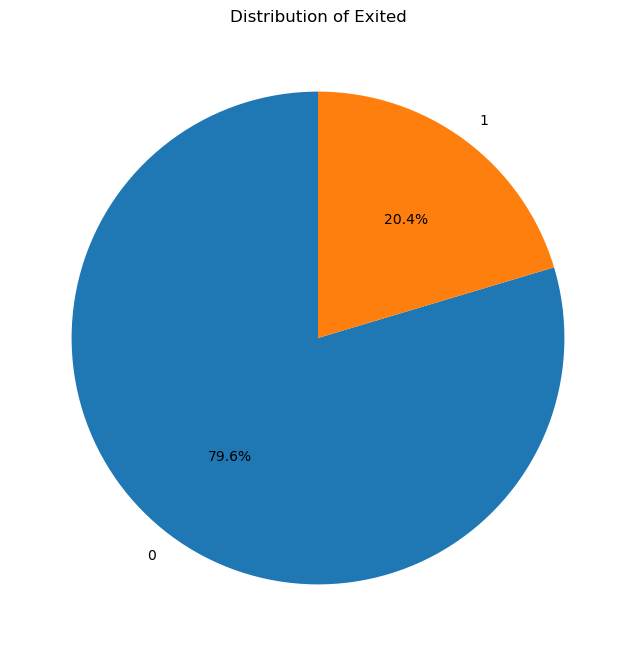

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame

# Compute the distribution of the Exited column
exited_counts = df['Exited'].value_counts()

# Plot a pie chart with percentages
plt.figure(figsize=(8, 8))
exited_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Exited')
plt.ylabel('')  # This is to remove the default 'None' ylabel
plt.show()


In [11]:
import folium

# Create a base map
m = folium.Map(location=[48.8566, 2.3522], zoom_start=4)  # starting at the coordinates for Paris, France

# Get max and min counts for scaling purposes
max_count = country_counts['Count'].max()
min_count = country_counts['Count'].min()

for _, row in country_counts.iterrows():
    country = row['Country']
    count = row['Count']
    
    # Latitude and longitude for the three countries
    lat_lon_lookup = {
        'France': [48.8566, 2.3522],   # Paris
        'Germany': [52.5200, 13.4050], # Berlin
        'Spain': [40.4168, -3.7038]    # Madrid
    }
    
    location = lat_lon_lookup[country]
    
    # Scale the radius based on the count (you can adjust this formula as needed)
    scaled_radius = 5 + (count - min_count) / (max_count - min_count) * 20
    
    # Adjust color intensity
    color_intensity = (count - min_count) / (max_count - min_count)
    color = f'#{int(255 * (1 - color_intensity)):02x}7f{int(255 * color_intensity):02x}'  # Interpolates between light blue and dark blue
    
    folium.CircleMarker(
        location=location,
        radius=scaled_radius,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f'{country}: {count}'
    ).add_to(m)

m

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_count(df, column_name, n=None):
    """
    Generate a count plot for a given column in a dataframe and annotate bars with their counts.
    
    Parameters:
    - df: pandas DataFrame
    - column_name: Name of the column for which count plot is to be generated
    - n: Number of top unique values to display. If None, all unique values are displayed.
    """
    
    # If n is provided, select top n unique values
    if n:
        top_n_values = df[column_name].value_counts().index[:n]
        df = df[df[column_name].isin(top_n_values)]
    
    # Create count plot
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=column_name, order=df[column_name].value_counts().index)
    
    # Annotate each bar with its count
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', xytext=(0, 5), textcoords='offset points')
    
    plt.title(f"Count Plot for {column_name}")
    plt.xticks(rotation=90)  # Rotate x-axis labels if needed
    plt.show()

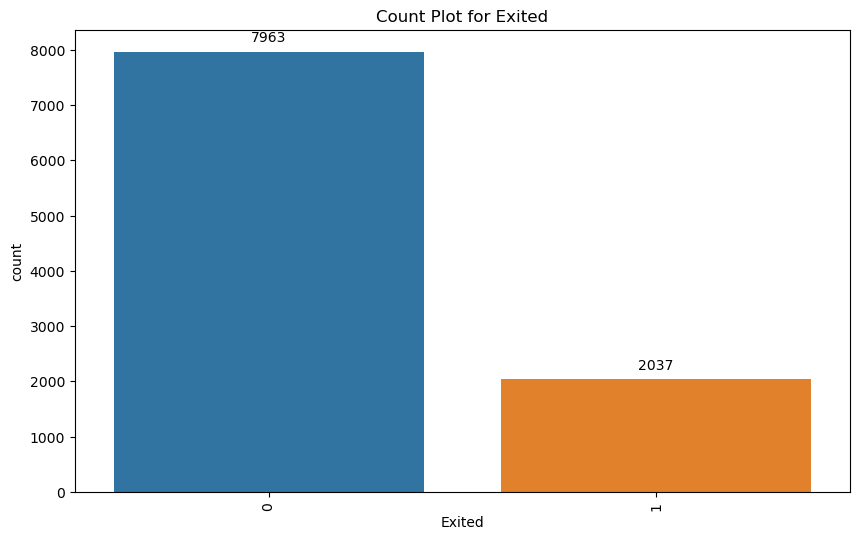

In [13]:
plot_count(df,"Exited")

In [14]:
# Data Imbalance 
## 1)Upsampling
## 2)DownSampling
## 3)SMOTE

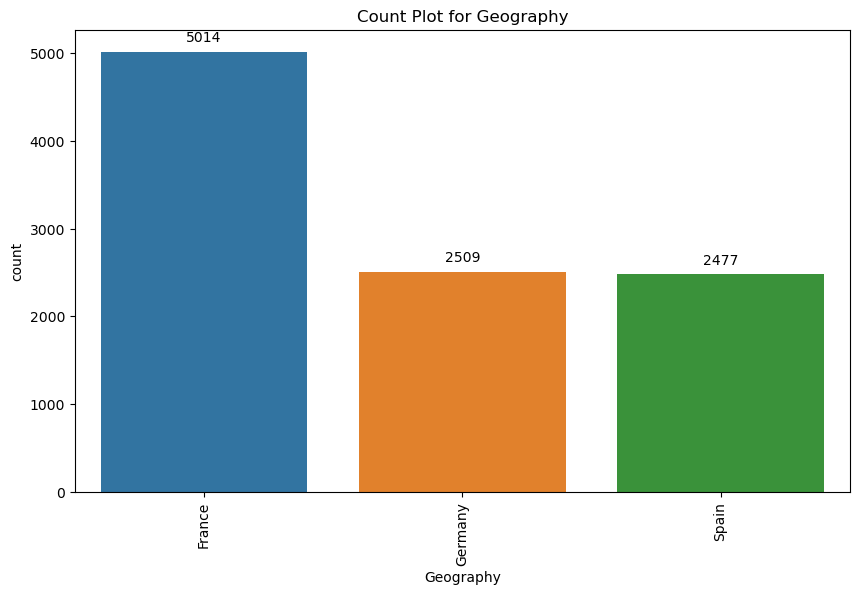

In [15]:
plot_count(df,"Geography")

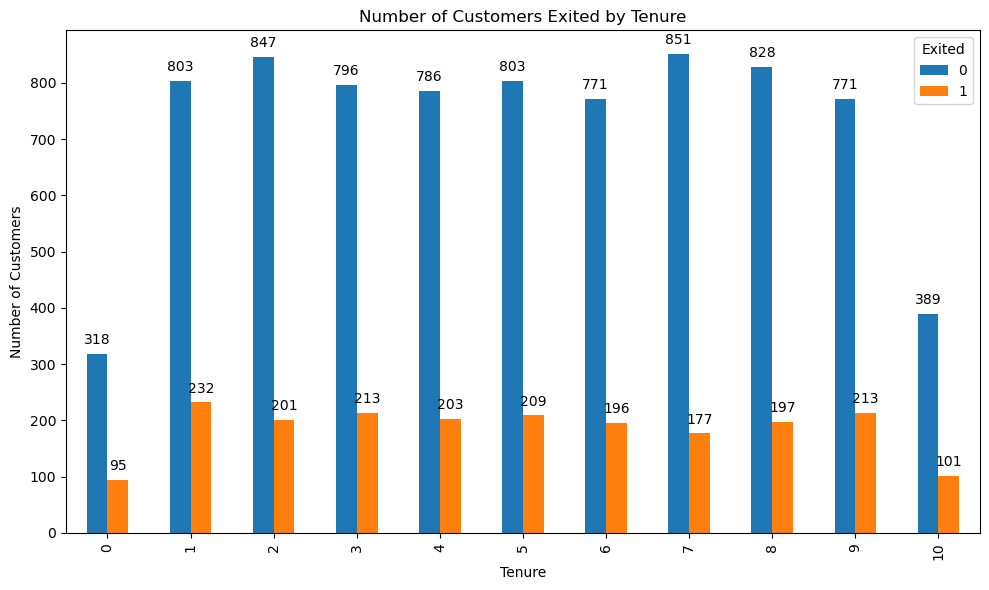

In [16]:
import pandas as pd
import matplotlib.pyplot as plt



grouped = df.groupby(['Tenure', 'Exited']).size().unstack()

# Plotting
ax = grouped.plot(kind='bar', stacked=False, figsize=(10,6))

# Adding counts above barsa
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.title('Number of Customers Exited by Tenure')
plt.ylabel('Number of Customers')
plt.xlabel('Tenure')
plt.tight_layout()
plt.show()


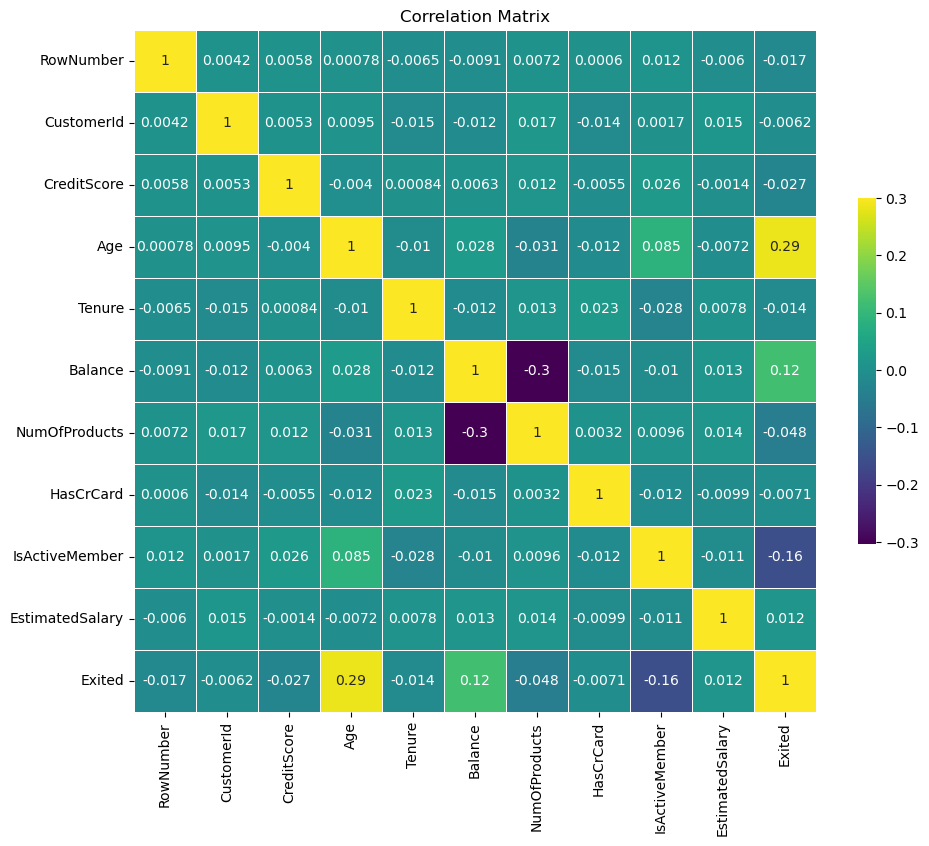

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr = df.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Draw the heatmap with annotations
sns.heatmap(corr, cmap='viridis', vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Matrix')
plt.show()


In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

def check_normality(df, column_name):
    # Histogram
    plt.figure(figsize=(12, 6))
    sns.histplot(df[column_name], kde=True)
    plt.title(f'Histogram of {column_name}')
    plt.show()
    
    # QQ Plot
    plt.figure(figsize=(12, 6))
    stats.probplot(df[column_name].dropna(), dist="norm", plot=plt)  # dropna() to ensure no NaN values are passed
    plt.title(f'QQ Plot of {column_name}')
    plt.show()
    

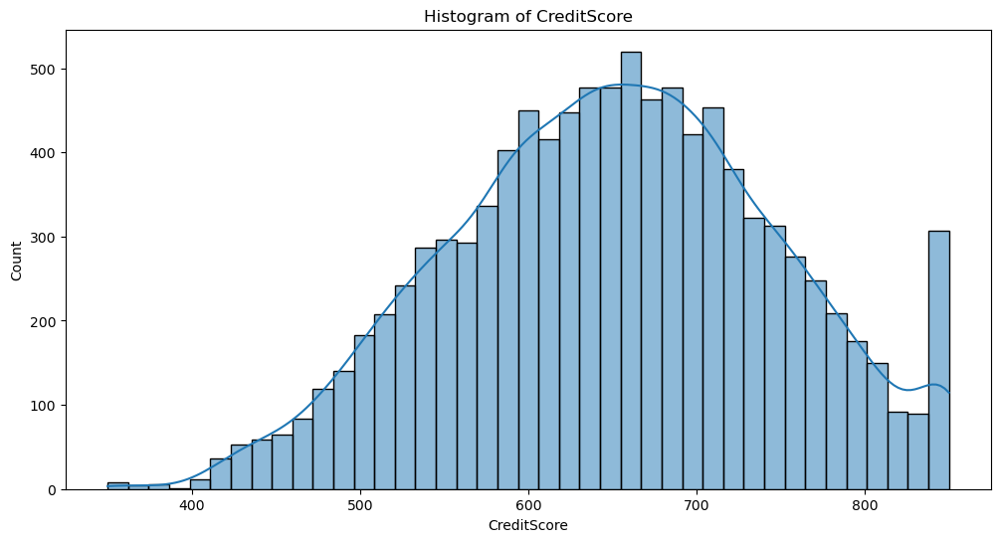

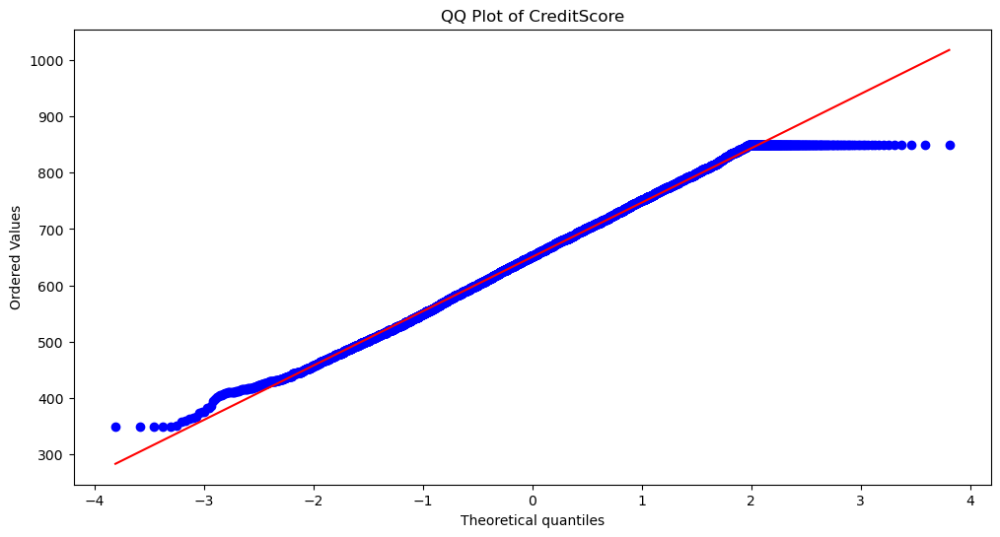

In [19]:
check_normality(df,"CreditScore")

#normally Distriobuted column helps in classification part

### That column seems to be Normally Distributed

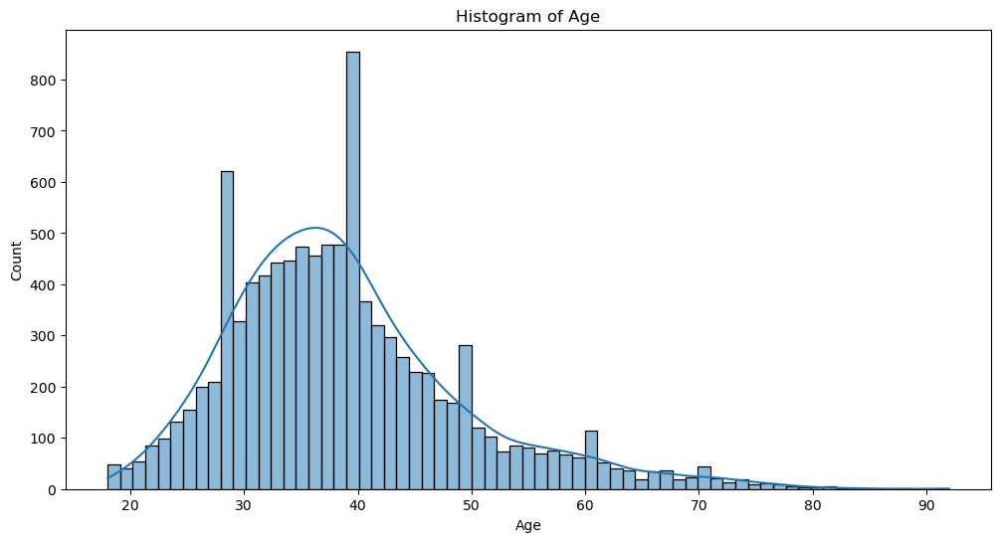

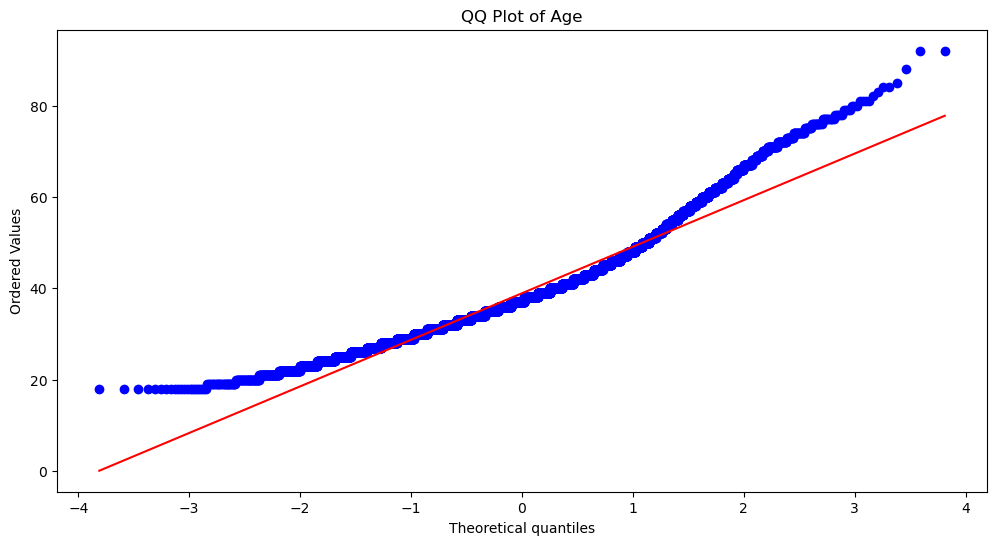

In [20]:
check_normality(df,"Age")

### Age appears to be not normally distributed

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_relationship(df, column_name):
    """
    Plot relationship between 'Exited' and the provided column.
    """
    if df[column_name].dtype in ['int64', 'float64']:
        # Boxplot for numerical columns
        plt.figure(figsize=(10, 6))
        ax = sns.boxplot(data=df, x="Exited", y=column_name)
        
        # Annotating counts above boxes
        for i in range(len(ax.patches)):
            count = df[df["Exited"] == i][column_name].count()
            ax.annotate(f'Count: {count}', (i, df[column_name].max()),
                        ha='center', va='center', fontsize=10, color='black',
                        xytext=(0, 10), textcoords='offset points')
        
    else:
        # Count plot for categorical columns
        plt.figure(figsize=(10, 6))
        ax = sns.countplot(data=df, x=column_name, hue="Exited")
        
        # Annotating counts on each bar
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center', va='bottom', fontsize=10, color='black',
                        xytext=(0, 5), textcoords='offset points')
    
    plt.title(f"Relationship between Exited and {column_name}")
    plt.show()


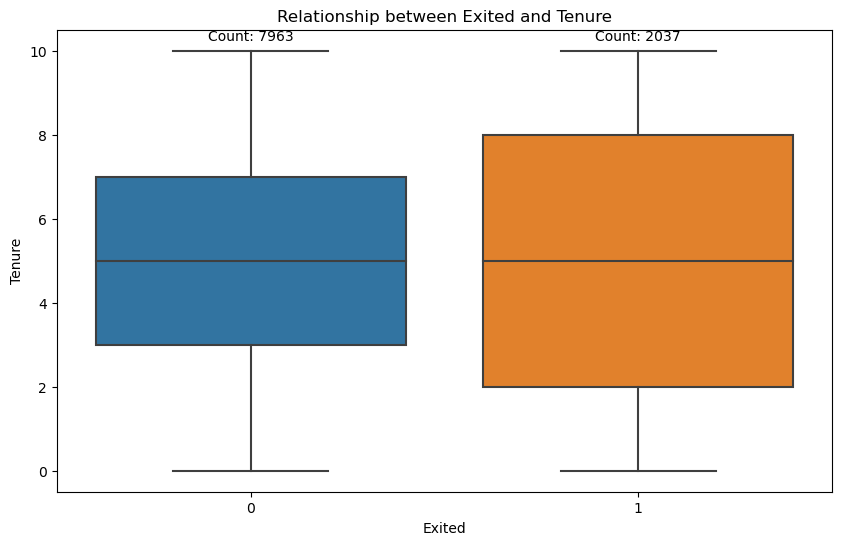

In [22]:
plot_relationship(df,"Tenure")

## Probability of exit seems to be more in these tenures
## 1) Between 2 to 3 years
## 2) Tenure between 7 and 8 years

## Relation between Age and Exit Column

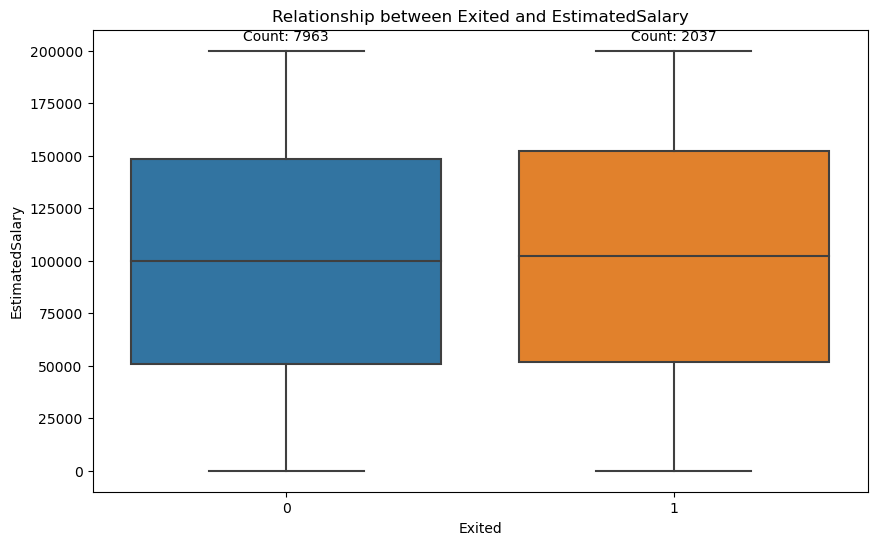

In [23]:
plot_relationship(df,"EstimatedSalary")  

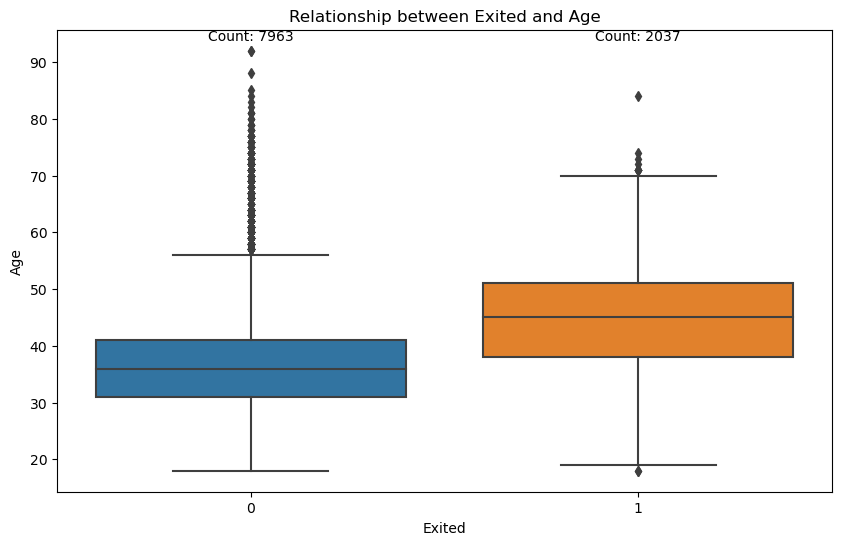

In [24]:
plot_relationship(df,"Age") 

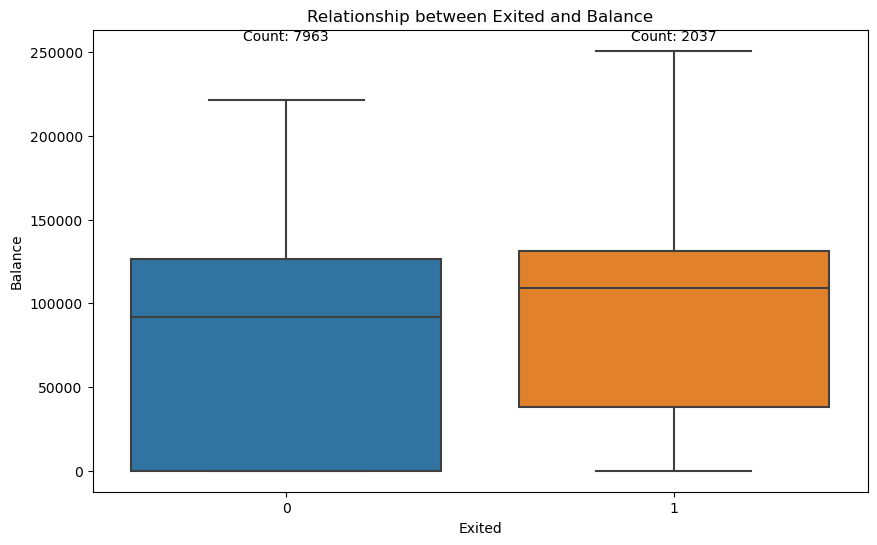

In [25]:
plot_relationship(df,"Balance")  

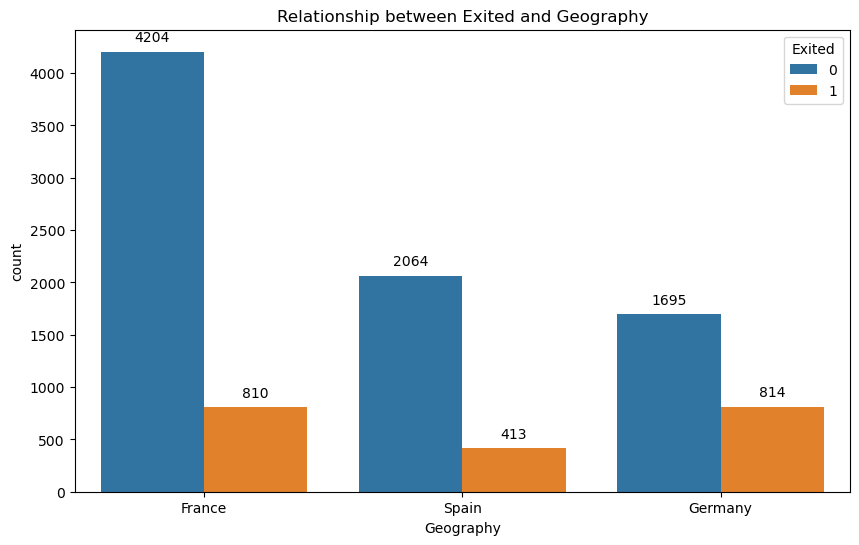

In [26]:
plot_relationship(df,"Geography")

### Credit card Impact on Customer Churn

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_relationship(df, column_name):
    """
    Plot relationship between 'Exited' and the provided column.
    """
    unique_values = df[column_name].nunique()
    if unique_values <= 5 or df[column_name].dtype not in ['int64', 'float64']:
        # Count plot for categorical columns
        plt.figure(figsize=(10, 6))
        ax = sns.countplot(data=df, x=column_name, hue="Exited")
        
        # Annotating counts on each bar
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center', va='bottom', fontsize=10, color='black',
                        xytext=(0, 5), textcoords='offset points')
    else:
        # Boxplot for numerical columns
        plt.figure(figsize=(10, 6))
        ax = sns.boxplot(data=df, x="Exited", y=column_name)
        
        # Annotating counts above boxes
        for i in range(len(ax.patches)):
            count = df[df["Exited"] == i][column_name].count()
            ax.annotate(f'Count: {count}', (i, df[column_name].max()),
                        ha='center', va='center', fontsize=10, color='black',
                        xytext=(0, 10), textcoords='offset points')
    
    plt.title(f"Relationship between Exited and {column_name}")
    plt.show()


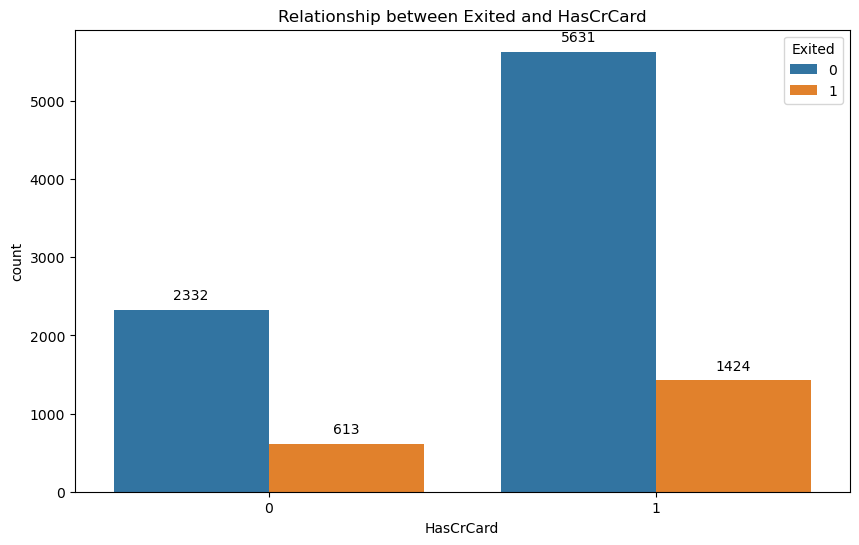

In [28]:
plot_relationship(df,"HasCrCard")

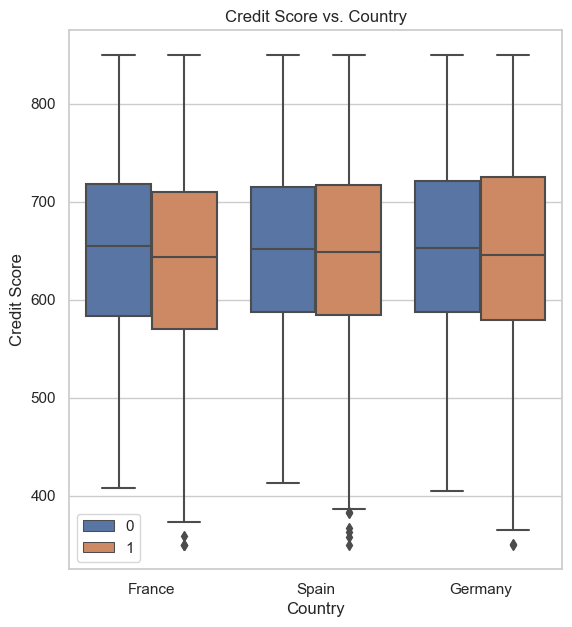

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame

# Set the style of the plot
sns.set(style="whitegrid")

# Create a figure with subplots
plt.figure(figsize=(14, 7))

# Create the first boxplot for CreditScore
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st plot
sns.boxplot(x='Geography', y='CreditScore', hue='Exited', data=df)
plt.xlabel('Country')
plt.ylabel('Credit Score')
plt.title('Credit Score vs. Country')
plt.legend()
plt.show()


In [30]:
# Sample code to remove specific columns and perform one-hot encoding
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


df = df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)
df_encoded = pd.get_dummies(df, columns=['Geography', 'Gender'], drop_first=True)

# Separate out features and target
X = df_encoded.drop('Exited', axis=1)
y = df_encoded['Exited']

print("Before SMOTE:", Counter(y))

# Apply SMOTE
smote = SMOTE(random_state=42)

X_res, y_res = smote.fit_resample(X, y)

print("After SMOTE:", Counter(y_res))

# Create DataFrame for features
df = pd.DataFrame(X_res, columns=X.columns)

# Append the target variable
df = pd.concat([df, pd.Series(y_res, name='Exited')], axis=1)


Before SMOTE: Counter({0: 7963, 1: 2037})
After SMOTE: Counter({1: 7963, 0: 7963})


### After Applying SMOTE

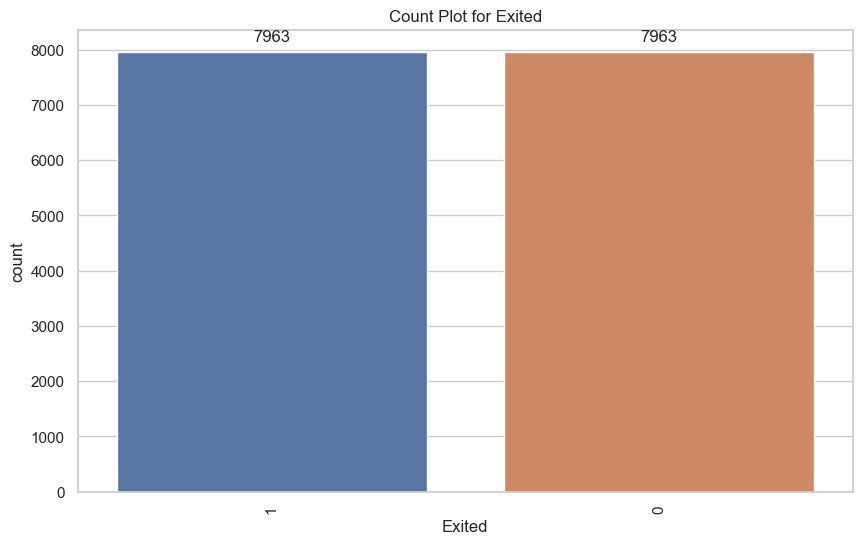

In [31]:
plot_count(df,"Exited")

In [32]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming df is your DataFrame

# Selecting the columns for PCA (excluding non-numeric columns)
columns_for_pca = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 
                   'HasCrCard', 'IsActiveMember', 'EstimatedSalary']

columns_for_std =  ["CreditScore","Age","Tenure","Balance","EstimatedSalary","NumOfProducts"]
# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[columns_for_std])

# Perform PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame for the principal components
pc_df = pd.DataFrame(data=principal_components, columns=['PCA1', 'PCA2', 'PCA3'])

# Check the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Print the explained variance ratio for each component
for i, evr in enumerate(explained_variance_ratio, 1):
    print(f'Explained Variance for PCA{i}: {evr:.4f}')

# Determine which component contributes the most to the variance
most_contributing_component = np.argmax(explained_variance_ratio) + 1

# Print the most contributing component
print(f'The most contributing component is PCA{most_contributing_component}.')


# Print the loadings (eigenvectors) to understand which original features contribute most to each PC
loadings = pca.components_
loadings_df = pd.DataFrame(loadings.T, columns=['PCA1', 'PCA2', 'PCA3'], index=columns_for_std)
print("\nLoadings (Eigenvectors):")
print(loadings_df)



Explained Variance for PCA1: 0.2113
Explained Variance for PCA2: 0.1727
Explained Variance for PCA3: 0.1719
The most contributing component is PCA1.

Loadings (Eigenvectors):
                     PCA1      PCA2      PCA3
CreditScore      0.024541 -0.077364 -0.747876
Age             -0.332884  0.369878  0.272053
Tenure           0.140143 -0.721983 -0.117448
Balance         -0.632981 -0.301634 -0.123203
EstimatedSalary  0.036710 -0.488771  0.579859
NumOfProducts    0.683325  0.077884  0.038201


In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go  # Add this line

# Assuming df is your DataFrame

# ... (previous code)

# Create a 3D scatter plot
fig = go.Figure()

# Scatter plot of the principal components
fig.add_trace(go.Scatter3d(
    x=pc_df['PCA1'],
    y=pc_df['PCA2'],
    z=pc_df['PCA3'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['Exited'],  # Color points by 'Exited' column
        colorscale='Viridis',  # Choose color scale
        opacity=0.6
    )
))

# Add biplot arrows
for feature in loadings_df.index:  # Access the features using index (e.g., 'CreditScore', 'Age', ...)
    fig.add_trace(go.Scatter3d(
        x=[0, loadings_df.loc[feature, 'PCA1']],
        y=[0, loadings_df.loc[feature, 'PCA2']],
        z=[0, loadings_df.loc[feature, 'PCA3']],
        mode='lines+markers',
        line=dict(color='red', width=5),
        marker=dict(size=0),
        name=feature
    ))

# Set axis labels
fig.update_layout(scene=dict(
    xaxis_title='PCA1',
    yaxis_title='PCA2',
    zaxis_title='PCA3'
))

# Show the plot
fig.show()


### Feature Engineering

In [34]:
df['CreditAgeRatio'] = df['CreditScore'] / df['Age']
df['BalancePerProduct'] = df['Balance'] / df['NumOfProducts']
df['SalaryPerAge'] = df['EstimatedSalary'] / df['Age']
df['ActiveWithCard'] = np.where((df['IsActiveMember'] == 1) & (df['HasCrCard'] == 1), 1, 0)
df['IsRetired'] = np.where(df['Age'] >= 65, 1, 0)

## TSNE Plot

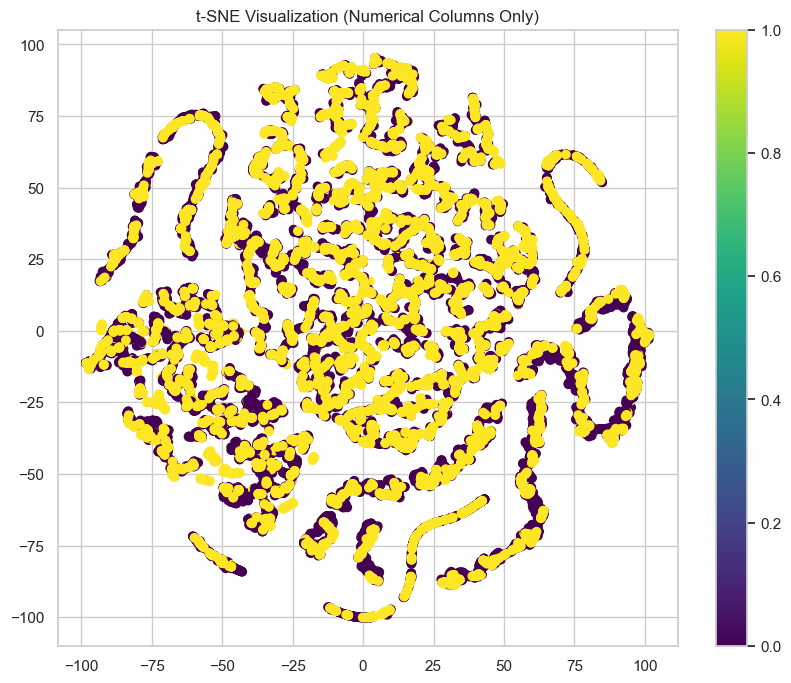

In [35]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Assuming you have a target variable 'Exited'

# Selecting only the numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

X = df[numerical_columns]
y = df['Exited']

# Initialize the t-SNE object
tsne = TSNE(n_components=2, random_state=100)

# Perform t-SNE
X_tsne = tsne.fit_transform(X)

# Create a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis')
plt.title('t-SNE Visualization (Numerical Columns Only)')
plt.colorbar()
plt.show()


In [36]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import plotly.express as px

# Assuming df is your DataFrame
# Assuming you have a target variable 'Exited'

# Selecting only the numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

X = df[numerical_columns]
y = df['Exited']

# Initialize the t-SNE object with 3 components for 3D
tsne = TSNE(n_components=3, random_state=100)

# Perform t-SNE
X_tsne = tsne.fit_transform(X)

# Convert the results into a DataFrame
df_tsne = pd.DataFrame(data = X_tsne, columns = ['Dimension 1', 'Dimension 2', 'Dimension 3'])
df_tsne['Exited'] = y

# Create the 3D scatter plot using plotly
fig = px.scatter_3d(df_tsne, x='Dimension 1', y='Dimension 2', z='Dimension 3', color='Exited', 
                    color_continuous_scale='viridis', opacity=0.8)

fig.update_layout(title='3D t-SNE Visualization (Numerical Columns Only)')
fig.show()


In [36]:

X = df.drop('Exited', axis=1)
y = df['Exited']


columns_for_std =  ["CreditScore","Age","Tenure","Balance","EstimatedSalary","NumOfProducts"]
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a StandardScaler
scaler = StandardScaler()

# Fit the scaler on X_train and transform X_train
X_train[columns_for_std] = scaler.fit_transform(X_train[columns_for_std])

# Transform X_test using the same scaler
X_test[columns_for_std] = scaler.transform(X_test[columns_for_std])



In [37]:
X_train.columns

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Germany',
       'Geography_Spain', 'Gender_Male', 'CreditAgeRatio', 'BalancePerProduct',
       'SalaryPerAge', 'ActiveWithCard', 'IsRetired'],
      dtype='object')

## Logistic Regression

Accuracy: 0.7580


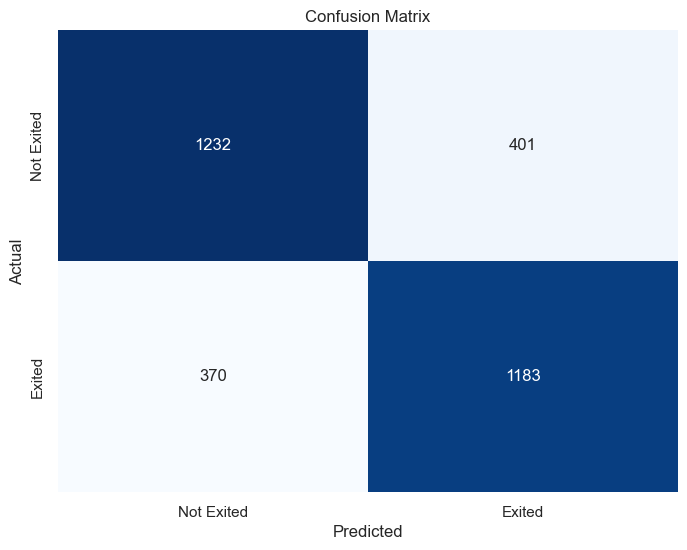

              precision    recall  f1-score   support

           0       0.77      0.75      0.76      1633
           1       0.75      0.76      0.75      1553

    accuracy                           0.76      3186
   macro avg       0.76      0.76      0.76      3186
weighted avg       0.76      0.76      0.76      3186



In [38]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns


# Initialize and train a logistic regression model
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)

# Predict on the test set
y_pred = log_reg.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Calculate accuracy and recall
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

## SVM with linear kernel

Accuracy: 0.6927


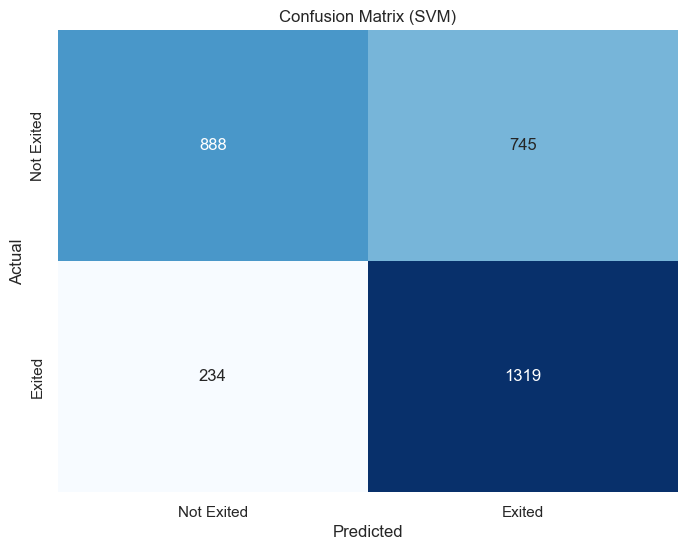

              precision    recall  f1-score   support

           0       0.79      0.54      0.64      1633
           1       0.64      0.85      0.73      1553

    accuracy                           0.69      3186
   macro avg       0.72      0.70      0.69      3186
weighted avg       0.72      0.69      0.69      3186



In [39]:
from sklearn.svm import SVC

# Initialize and train an SVM classifier
svm_classifier = SVC(kernel='linear', random_state=42)
svm_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_svm = svm_classifier.predict(X_test)

# Calculate accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f'Accuracy: {accuracy_svm:.4f}')

# Plot confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (SVM)')
plt.show()

# Calculate accuracy and recall
classification_rep_svm = classification_report(y_test, y_pred_svm)
print(classification_rep_svm)


## SVM with poly kernel

Accuracy: 0.5741


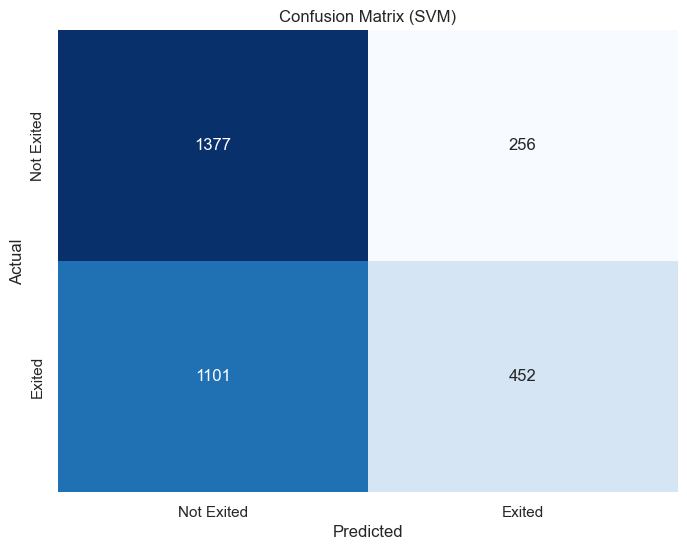

              precision    recall  f1-score   support

           0       0.56      0.84      0.67      1633
           1       0.64      0.29      0.40      1553

    accuracy                           0.57      3186
   macro avg       0.60      0.57      0.53      3186
weighted avg       0.60      0.57      0.54      3186



In [40]:
from sklearn.svm import SVC

# Initialize and train an SVM classifier
svm_classifier = SVC(kernel='poly', random_state=42)
svm_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_svm = svm_classifier.predict(X_test)

# Calculate accuracy
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f'Accuracy: {accuracy_svm:.4f}')

# Plot confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (SVM)')
plt.show()

# Calculate accuracy and recall
classification_rep_svm = classification_report(y_test, y_pred_svm)
print(classification_rep_svm)


Accuracy (Decision Tree): 0.7910


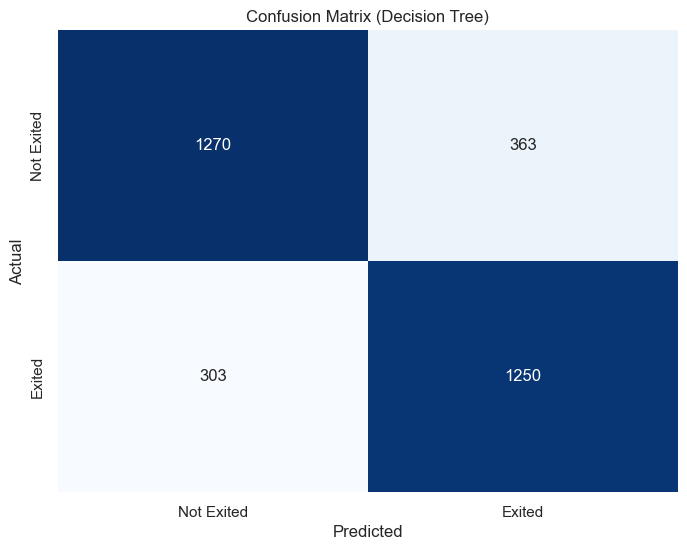

              precision    recall  f1-score   support

           0       0.81      0.78      0.79      1633
           1       0.77      0.80      0.79      1553

    accuracy                           0.79      3186
   macro avg       0.79      0.79      0.79      3186
weighted avg       0.79      0.79      0.79      3186



In [41]:
from sklearn.tree import DecisionTreeClassifier

# Initialize and train a Decision Tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_dt = dt_classifier.predict(X_test)

# Calculate accuracy
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Accuracy (Decision Tree): {accuracy_dt:.4f}')

# Plot confusion matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Decision Tree)')
plt.show()

# Calculate accuracy and recall
classification_rep_dt = classification_report(y_test, y_pred_dt)
print(classification_rep_dt)


Accuracy (Random Forest): 0.8606


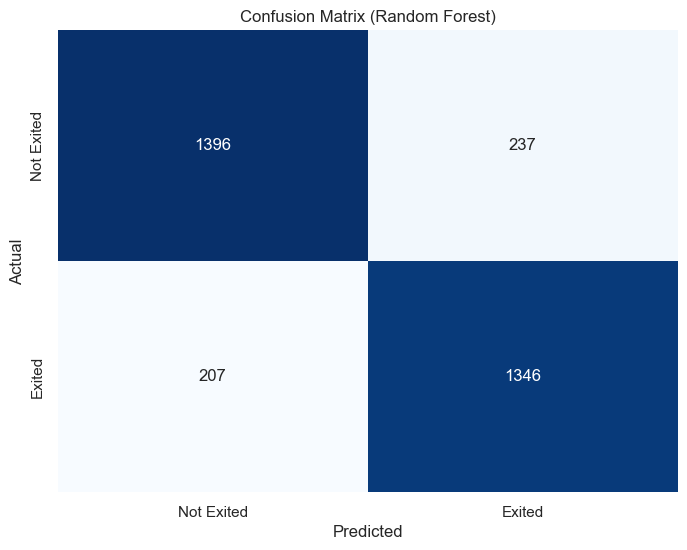

              precision    recall  f1-score   support

           0       0.87      0.85      0.86      1633
           1       0.85      0.87      0.86      1553

    accuracy                           0.86      3186
   macro avg       0.86      0.86      0.86      3186
weighted avg       0.86      0.86      0.86      3186



In [42]:
from sklearn.ensemble import RandomForestClassifier

# Initialize and train a Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred_rf = rf_classifier.predict(X_test)

# Calculate accuracy
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f'Accuracy (Random Forest): {accuracy_rf:.4f}')

# Plot confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()

# Calculate accuracy and recall
classification_rep_rf = classification_report(y_test, y_pred_rf)
print(classification_rep_rf)


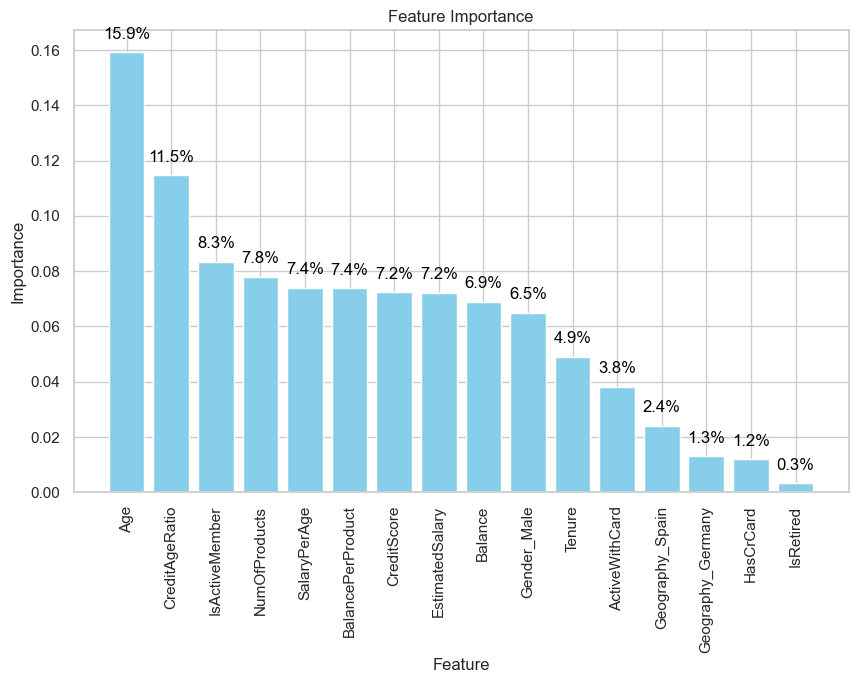

In [43]:
importance_rf = rf_classifier.feature_importances_
features = X.columns

# Create a DataFrame for feature importances
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance_rf})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.xticks(rotation=90)

# Adding percentage labels above the bars
for i, v in enumerate(importance_df['Importance']):
    plt.text(i, v + 0.005, f'{v*100:.1f}%', color='black', ha='center')


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1088      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 8)                 264       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 3,441
Trainable params: 3,441
Non-trainable params: 0
_________________________________________________________________
100/100 [==============================] - 0s 394us/step
Accuracy (Neural Network): 0.6058


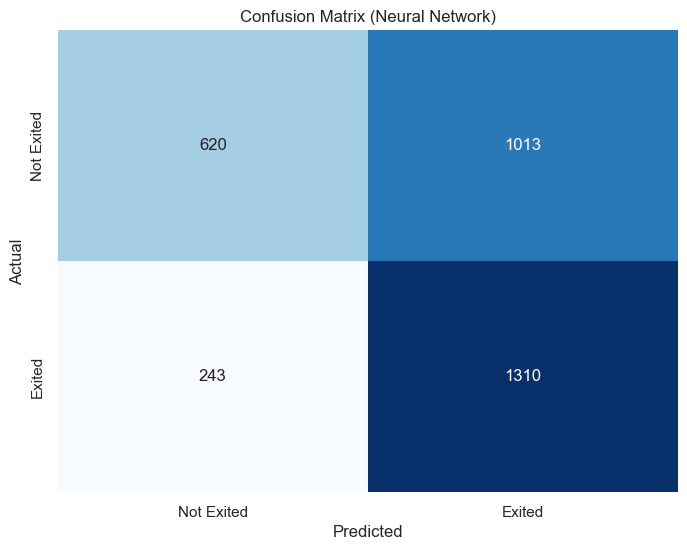

              precision    recall  f1-score   support

           0       0.72      0.38      0.50      1633
           1       0.56      0.84      0.68      1553

    accuracy                           0.61      3186
   macro avg       0.64      0.61      0.59      3186
weighted avg       0.64      0.61      0.58      3186



In [44]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Initialize a Sequential model
nn_classifier = Sequential()

# Add layers
nn_classifier.add(Dense(units=64, activation='relu', input_shape=(X_train.shape[1],)))
nn_classifier.add(Dense(units=32, activation='relu'))
nn_classifier.add(Dense(units=8, activation='relu'))

# Output layer (since this is binary classification, we use 1 unit and 'sigmoid' activation)
nn_classifier.add(Dense(units=1, activation='sigmoid'))

# Compile the model
nn_classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
nn_classifier.summary()

nn_classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
nn_classifier.fit(X_train, y_train, epochs=10, verbose=0)

# Predict on the test set
y_pred_nn = (nn_classifier.predict(X_test) > 0.5).astype('int32')

# Calculate accuracy
accuracy_nn = accuracy_score(y_test, y_pred_nn)
print(f'Accuracy (Neural Network): {accuracy_nn:.4f}')

# Plot confusion matrix
cm_nn = confusion_matrix(y_test, y_pred_nn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_nn, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Not Exited', 'Exited'], yticklabels=['Not Exited', 'Exited'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Neural Network)')
plt.show()

# Calculate accuracy and recall
classification_rep_nn = classification_report(y_test, y_pred_nn)
print(classification_rep_nn)


In [45]:
!pip install streamlit_jupyter

In [46]:
!streamlit run streamlit_app.py

Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: streamlit_app.py


In [47]:
df.iloc[100]

CreditScore             665.00000
Age                      40.00000
Tenure                    6.00000
Balance                   0.00000
NumOfProducts             1.00000
HasCrCard                 1.00000
IsActiveMember            1.00000
EstimatedSalary      161848.03000
Geography_Germany         0.00000
Geography_Spain           0.00000
Gender_Male               0.00000
Exited                    0.00000
CreditAgeRatio           16.62500
BalancePerProduct         0.00000
SalaryPerAge           4046.20075
ActiveWithCard            1.00000
IsRetired                 0.00000
Name: 100, dtype: float64

In [48]:
y_train

13555    1
1665     0
14878    1
7471     0
2582     0
        ..
13418    1
5390     1
860      1
15795    1
7270     0
Name: Exited, Length: 12740, dtype: int64

In [49]:
import pandas as pd
import numpy as np
import joblib
from sklearn.ensemble import RandomForestClassifier
import ipywidgets as widgets
from IPython.display import display


# Create widgets for inputs
CreditScore = widgets.IntText(value=500, description='Credit Score', min=0, max=850)
Geography = widgets.Dropdown(options=['France', 'Spain', 'Germany'], description='Geography')
Gender = widgets.Dropdown(options=['Male', 'Female'], description='Gender')
Age = widgets.IntText(value=30, description='Age', min=18, max=100)
Tenure = widgets.IntText(value=5, description='Tenure', min=0, max=20)
Balance = widgets.FloatText(value=50000, description='Balance', min=0, max=250000)
NumOfProducts = widgets.IntText(value=1, description='Number of Products', min=1, max=4)
HasCrCard = widgets.Dropdown(options=[0, 1], description='Has Credit Card')
IsActiveMember = widgets.Dropdown(options=[0, 1], description='Is Active Member')
EstimatedSalary = widgets.FloatText(value=50000, description='Estimated Salary', min=0, max=200000)
predict_button = widgets.Button(description='Predict Exit')

# Display widgets
display(CreditScore, Geography, Gender, Age, Tenure, Balance, NumOfProducts, HasCrCard, IsActiveMember, EstimatedSalary, predict_button)

# Prediction function
def on_predict_button_clicked(b):
    # Create a DataFrame for the input
    input_data = pd.DataFrame({
        'CreditScore': [CreditScore.value],
        'Age': [Age.value],
        'Tenure': [Tenure.value],
        'Balance': [Balance.value],
        'NumOfProducts': [NumOfProducts.value],
        'EstimatedSalary': [EstimatedSalary.value]
    })

    # Scale the numeric inputs
    input_data_scaled = scaler.transform(input_data)

    # Create a new DataFrame with scaled values
    input_data = pd.DataFrame(input_data_scaled, columns=input_data.columns)

    # Add the non-scaled inputs
    input_data['IsActiveMember'] = IsActiveMember.value
    input_data['HasCrCard'] = HasCrCard.value

    # Calculate derived features
    input_data['CreditAgeRatio'] = CreditScore.value / Age.value
    input_data['BalancePerProduct'] = Balance.value / NumOfProducts.value
    input_data['SalaryPerAge'] = EstimatedSalary.value / Age.value
    input_data['ActiveWithCard'] = 1 if (IsActiveMember.value == 1 and HasCrCard.value == 1) else 0
    input_data['IsRetired'] = 1 if Age.value >= 65 else 0

    # Encode categorical variables
    input_data['Geography_Germany'] = 1 if Geography.value == 'Germany' else 0
    input_data['Geography_Spain'] = 1 if Geography.value == 'Spain' else 0
    input_data['Gender_Male'] = 1 if Gender.value == 'Male' else 0

    # Predict using rf_classifier
    prediction = rf_classifier.predict(input_data)

    # Display result
    print("The predicted class is:", prediction[0])

predict_button.on_click(on_predict_button_clicked)


IntText(value=500, description='Credit Score')

Dropdown(description='Geography', options=('France', 'Spain', 'Germany'), value='France')

Dropdown(description='Gender', options=('Male', 'Female'), value='Male')

IntText(value=30, description='Age')

IntText(value=5, description='Tenure')

FloatText(value=50000.0, description='Balance')

IntText(value=1, description='Number of Products')

Dropdown(description='Has Credit Card', options=(0, 1), value=0)

Dropdown(description='Is Active Member', options=(0, 1), value=0)

FloatText(value=50000.0, description='Estimated Salary')

Button(description='Predict Exit', style=ButtonStyle())

The predicted class is: 0


In [50]:
import pandas as pd
import numpy as np
import joblib
from sklearn.ensemble import RandomForestClassifier
import ipywidgets as widgets
from IPython.display import display


# Create widgets for inputs
CreditScore = widgets.IntText(value=500, description='Credit Score', min=0, max=850)
Geography = widgets.Dropdown(options=['France', 'Spain', 'Germany'], description='Geography')
Gender = widgets.Dropdown(options=['Male', 'Female'], description='Gender')
Age = widgets.IntText(value=30, description='Age', min=18, max=100)
Tenure = widgets.IntText(value=5, description='Tenure', min=0, max=20)
Balance = widgets.FloatText(value=50000, description='Balance', min=0, max=250000)
NumOfProducts = widgets.IntText(value=1, description='Number of Products', min=1, max=4)
HasCrCard = widgets.Dropdown(options=[0, 1], description='Has Credit Card')
IsActiveMember = widgets.Dropdown(options=[0, 1], description='Is Active Member')
EstimatedSalary = widgets.FloatText(value=50000, description='Estimated Salary', min=0, max=200000)
predict_button = widgets.Button(description='Predict Exit')

# Prediction function
def on_predict_button_clicked(b):
    # Create a DataFrame for the input
    input_data = pd.DataFrame({
        'CreditScore': [CreditScore.value],
        'Age': [Age.value],
        'Tenure': [Tenure.value],
        'Balance': [Balance.value],
        'NumOfProducts': [NumOfProducts.value],
        'EstimatedSalary': [EstimatedSalary.value]
    })

    # Scale the numeric inputs
    input_data_scaled = scaler.transform(input_data)

    # Create a new DataFrame with scaled values
    input_data = pd.DataFrame(input_data_scaled, columns=input_data.columns)

    # Add the non-scaled inputs
    input_data['IsActiveMember'] = IsActiveMember.value
    input_data['HasCrCard'] = HasCrCard.value

    # Calculate derived features
    input_data['CreditAgeRatio'] = CreditScore.value / Age.value
    input_data['BalancePerProduct'] = Balance.value / NumOfProducts.value
    input_data['SalaryPerAge'] = EstimatedSalary.value / Age.value
    input_data['ActiveWithCard'] = 1 if (IsActiveMember.value == 1 and HasCrCard.value == 1) else 0
    input_data['IsRetired'] = 1 if Age.value >= 65 else 0

    # Encode categorical variables
    input_data['Geography_Germany'] = 1 if Geography.value == 'Germany' else 0
    input_data['Geography_Spain'] = 1 if Geography.value == 'Spain' else 0
    input_data['Gender_Male'] = 1 if Gender.value == 'Male' else 0

    # Predict using rf_classifier
    prediction = rf_classifier.predict(input_data)

    # Display result
    print("The predicted class is:", prediction[0])
    
    

predict_button.on_click(on_predict_button_clicked)

